In [2]:
import WikitableScraper as ws
import GeoUtils as gu

import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import numpy as np
import pandas as pd
from sklearn import svm

import webbrowser as web
import os

# Constants

In [3]:
TMP_PATH = 'tmp'
EARTHQUAKE_CSV_PATH = 'rsc\\earthquakes.csv'
HTML_TEMPLATE_PATH = 'rsc\\template.html'
HTML_MAP_PATH = 'tmp\\map.html'
HTML_PLACEHOLDERS = ['*PLACEHOLDER*']

# CSV Load, Transform CSV to Json for Openlayers

In [4]:
csv = pd.read_csv(EARTHQUAKE_CSV_PATH)
csv = csv.rename(columns={'Longitude' : 'lng', 'Latitude' : 'lat'})
json = csv[['lng', 'lat', 'Date', 'Time', 'Magnitude']].to_json(orient='records')

In [5]:
#Load template html and replace *PLACEHOLDER* with the json file
with open(HTML_TEMPLATE_PATH, 'r') as file:
    html_text = file.read().replace(HTML_PLACEHOLDERS[0], json[1:-1])
#Create tmp folder if doesn't exist
if not os.path.exists(TMP_PATH):
    os.makedirs(TMP_PATH)
#Create map.html
with open(HTML_MAP_PATH, 'w') as file:
    file.write(html_text)
#Open map.html in browser
web.open(HTML_MAP_PATH)

True

# Plot graphs

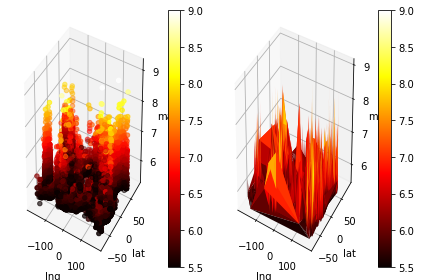

In [30]:
fig = plt.figure()


plot_data = csv[['lng', 'lat', 'Magnitude']]

points_lng = plot_data[['lng']].values.flatten()
points_lat = plot_data[['lat']].values.flatten()
points_mag = plot_data[['Magnitude']].values.flatten()


ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.scatter(points_lng, points_lat, points_mag, cmap='hot', c=points_mag)
ax.set_xlabel('lng')
ax.set_ylabel('lat')
ax.set_zlabel('mag')
fig.colorbar(c, ax=ax)

ax2 = fig.add_subplot(1, 2, 2, projection='3d')
ax2.plot_trisurf(points_lng, points_lat, points_mag, cmap=cm.hot)
ax2.set_xlabel('lng')
ax2.set_ylabel('lat')
ax2.set_zlabel('mag')
fig.colorbar(c, ax=ax2)
plt.tight_layout()